<a href="https://colab.research.google.com/github/aeyeniay/AdvancedProject2/blob/main/%20AP_Tirta/Scenario%202/AP_Tirta_2020_2021_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## 1. Library

In [1]:
pip install --upgrade pandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
pip install --upgrade matplotlib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [4]:
pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 KB 4.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283857 sha256=85a680d19c0e6f5ecce89952ff2a8297f3d4288a26b9be751a293ec9c3a30a08
  Stored in directory: /root/.cache/pip/wheels/e6/a6/20/cc1e293fcdb67ede666fed293cb895395e7ecceb4467779546
Successfully built lime


In [5]:
%matplotlib inline
from warnings import simplefilter
import numpy as np 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt 
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error,r2_score,mean_squared_error,mean_absolute_percentage_error
from sklearn.ensemble import RandomForestRegressor
import shap
import lime
from lime import lime_tabular
shap.initjs()

In [6]:
def eval(evaluation,y_true,y_train_pred,name):
  a_dict = {}
  a_dict['MAE'] = mean_absolute_error(y_true,y_train_pred)
  a_dict['MSE'] = mean_squared_error(y_true,y_train_pred)
  a_dict['MAPE']= round(mean_absolute_percentage_error(y_true,y_train_pred),6)
  a_dict['R squared'] = r2_score(y_true,y_train_pred)
  a_dict['RMSE'] = np.sqrt(mean_squared_error(y_true,y_train_pred))
  a_dict['RMSLE'] = np.log(np.sqrt(mean_squared_error(y_true,y_train_pred)))
  evaluation[name] = a_dict

## 2. Dataset

In [7]:
df = pd.read_csv(
    "Rice-Data-2018-2021.csv",
    index_col='Date',
    parse_dates=['Date'],
)

df.head()

,Average Price of Premium Quality Rice,Average Price of Medium Quality Rice,Average Price of Bad Quality Rice,Harvest Area (10^6 ha),Produksi Padi Nasional (10^6 Ton),Produksi Beras Nasional (10^6 Ton),Productivity (ku/ha)
Date,,,,,,,
2018-01-01,10349.91,10177.05,9792.59,0.54,2.78,1.59,51.48
2018-02-01,10381.74,10215.16,9987.10,1.07,5.74,3.29,53.64
2018-03-01,9892.56,9698.23,9554.06,1.77,9.68,5.55,54.69
2018-04-01,9524.96,9220.84,8991.36,1.41,7.60,4.36,53.90
2018-05-01,9523.88,9190.37,9001.50,1.00,4.90,2.81,49.00


In this scenario I will only take data from 2020-2021

In [8]:
df = df.iloc[24:,:]
df.head()

,Average Price of Premium Quality Rice,Average Price of Medium Quality Rice,Average Price of Bad Quality Rice,Harvest Area (10^6 ha),Produksi Padi Nasional (10^6 Ton),Produksi Beras Nasional (10^6 Ton),Productivity (ku/ha)
Date,,,,,,,
2020-01-01,10032.66,9805.40,9518.85,0.32,1.62,0.93,50.63
2020-02-01,10080.80,9844.13,9521.95,0.47,4.06,1.32,86.38
2020-03-01,10082.43,9826.68,9460.76,1.19,9.67,3.61,81.26
2020-04-01,10018.19,9671.03,8989.00,1.86,7.77,5.60,41.77
2020-05-01,9826.63,9526.55,8972.52,1.30,3.95,3.57,30.38


# 3. Exploratory Data Analysis (EDA)

Since this date is an important part of knowing when at certain intervals the rice price increases or decreases, we want to predict the possible dates or date ranges when the next data might occur And also because the algorithm cannot directly handle dates, let's extract some simple features from the date such as month and year, and omit the original date column. The Data Series column that will be created is the value of the sequence of numbers from when the data is obtained

In [9]:
df['Date'] = df.index
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d') 
df['Year']= df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Series'] = np.arange(1,len(df.index)+1)
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 24 entries, 2020-01-01 to 2021-12-01
Data columns (total 11 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   Average Price of Premium Quality Rice  24 non-null     float64       
 1   Average Price of Medium Quality Rice   24 non-null     float64       
 2   Average Price of Bad Quality Rice      24 non-null     float64       
 3   Harvest Area (10^6 ha)                 24 non-null     float64       
 4   Produksi Padi Nasional (10^6 Ton)      24 non-null     float64       
 5   Produksi Beras Nasional (10^6 Ton)     24 non-null     float64       
 6   Productivity (ku/ha)                   24 non-null     float64       
 7   Date                                   24 non-null     datetime64[ns]
 8   Year                                   24 non-null     int64         
 9   Month                                  24 non-n

In [10]:
df = df.drop(columns=['Date'])

In [11]:
df

,Average Price of Premium Quality Rice,Average Price of Medium Quality Rice,Average Price of Bad Quality Rice,Harvest Area (10^6 ha),Produksi Padi Nasional (10^6 Ton),Produksi Beras Nasional (10^6 Ton),Productivity (ku/ha),Year,Month,Series
Date,,,,,,,,,,
2020-01-01,10032.66,9805.40,9518.85,0.32,1.62,0.93,50.63,2020,1,1
2020-02-01,10080.80,9844.13,9521.95,0.47,4.06,1.32,86.38,2020,2,2
2020-03-01,10082.43,9826.68,9460.76,1.19,9.67,3.61,81.26,2020,3,3
2020-04-01,10018.19,9671.03,8989.00,1.86,7.77,5.60,41.77,2020,4,4
2020-05-01,9826.63,9526.55,8972.52,1.30,3.95,3.57,30.38,2020,5,5
2020-06-01,9918.95,9445.31,8926.15,0.74,4.04,2.05,54.59,2020,6,6
2020-07-01,9931.71,9316.30,8919.58,0.89,5.51,2.57,61.91,2020,7,7
2020-08-01,9962.65,9334.90,8986.32,1.20,4.16,3.33,34.67,2020,8,8
2020-09-01,9871.12,9404.58,9026.05,1.02,4.37,3.14,42.84,2020,9,9


In [12]:
df.describe()

,Average Price of Premium Quality Rice,Average Price of Medium Quality Rice,Average Price of Bad Quality Rice,Harvest Area (10^6 ha),Produksi Padi Nasional (10^6 Ton),Produksi Beras Nasional (10^6 Ton),Productivity (ku/ha),Year,Month,Series
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,9747.145417,9296.723333,8942.157917,0.875000,4.551250,2.612500,54.335833,2020.500000,6.500000,12.500000
std,212.593903,304.976082,284.344975,0.425093,2.177376,1.283356,13.590575,0.510754,3.526299,7.071068
min,9401.610000,8886.900000,8481.430000,0.290000,1.620000,0.930000,30.380000,2020.000000,1.000000,1.000000
25%,9547.142500,9002.830000,8706.567500,0.557500,3.680000,1.800000,50.207500,2020.000000,3.750000,6.750000
50%,9776.145000,9358.795000,8949.335000,0.785000,4.060000,2.370000,52.115000,2020.500000,6.500000,12.500000
75%,9922.140000,9449.685000,9065.297500,1.100000,4.760000,3.217500,55.152500,2021.000000,9.250000,18.250000
max,10082.430000,9844.130000,9521.950000,1.860000,9.670000,5.600000,86.380000,2021.000000,12.000000,24.000000


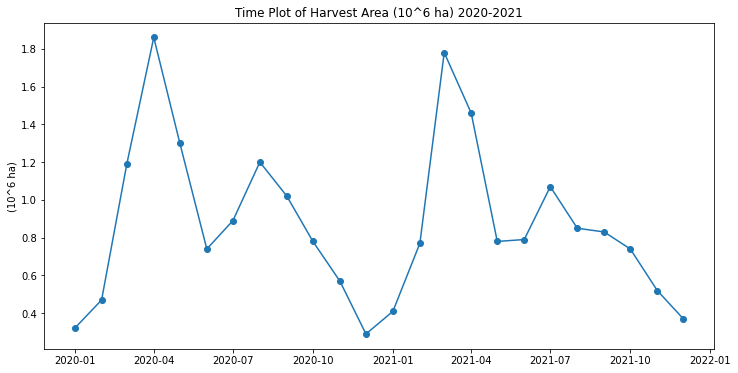

In [13]:
fig = plt.figure(figsize=(12, 6))
plt.plot(df['Harvest Area (10^6 ha)'],marker='o') 
plt.title('Time Plot of Harvest Area (10^6 ha) 2020-2021')
plt.ylabel("(10^6 ha)")
plt.show()

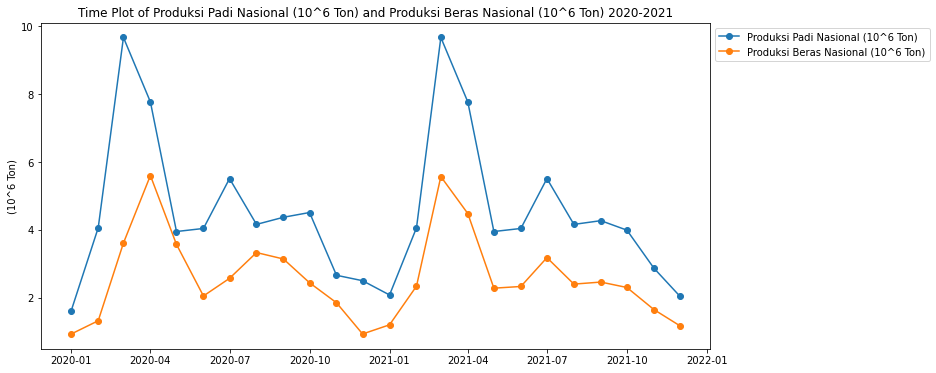

In [14]:
fig = plt.figure(figsize=(12, 6))
plt.plot(df['Produksi Padi Nasional (10^6 Ton)'],marker='o',label = 'Produksi Padi Nasional (10^6 Ton)') 
plt.plot(df['Produksi Beras Nasional (10^6 Ton)'],marker='o',label = 'Produksi Beras Nasional (10^6 Ton)') 
plt.title('Time Plot of Produksi Padi Nasional (10^6 Ton) and Produksi Beras Nasional (10^6 Ton) 2020-2021')
plt.legend(bbox_to_anchor = (1.0, 1), loc = 'upper left')
plt.ylabel("(10^6 Ton)")
plt.show()

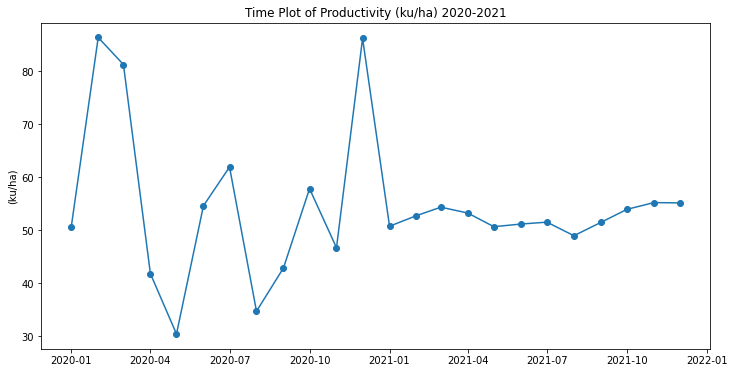

In [15]:
fig = plt.figure(figsize=(12, 6))
plt.plot(df['Productivity (ku/ha)'],marker='o') 
plt.title('Time Plot of Productivity (ku/ha) 2020-2021')
plt.ylabel("(ku/ha)")
plt.show()

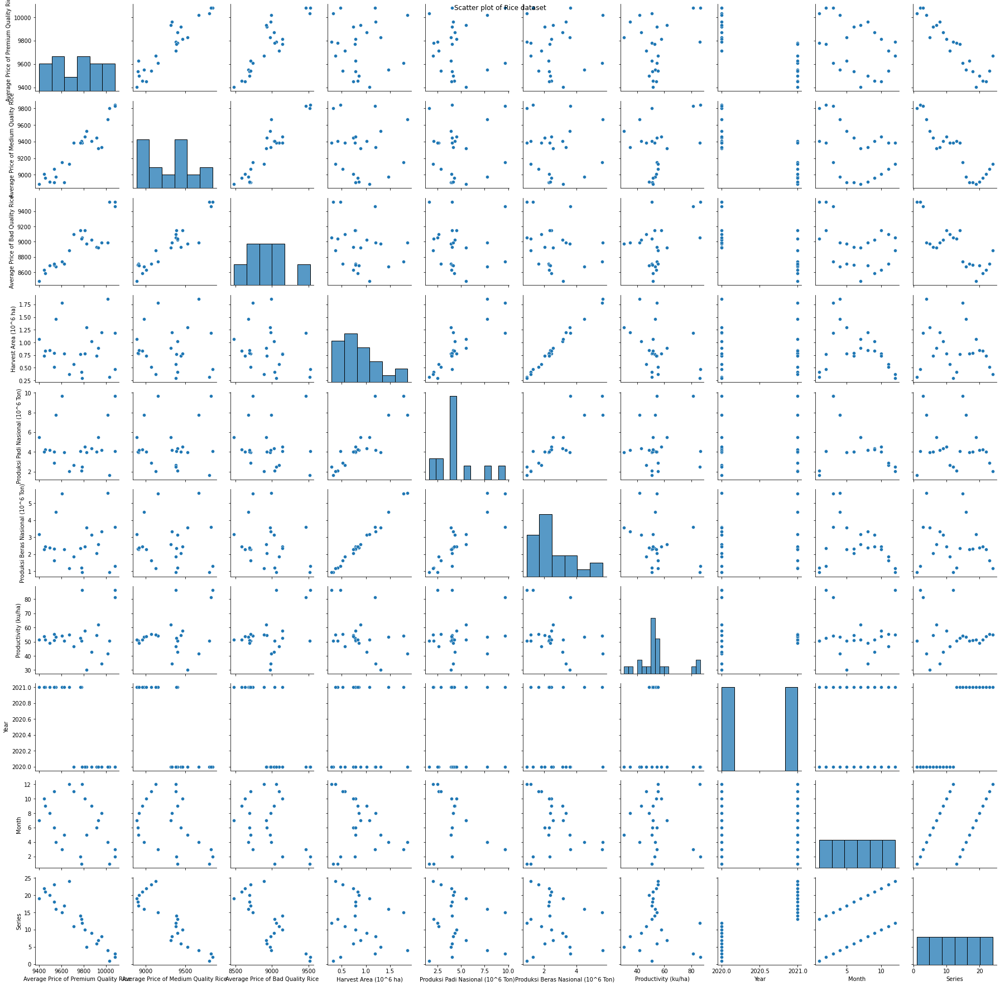

In [16]:
df_plot = df.copy()

g = sns.pairplot(df_plot)
g.fig.suptitle('Scatter plot of Rice dataset')
plt.tight_layout()
plt.show()

    From the results of the Scatter plots above, the following analysis results are obtained: 
    There are several features that have a linear relationship, 
    namely the relationship between Average Price of Premium Quality Rice, Average Price of Medium Quality Rice, and Average Price of Bad Quality Rice. 
    In addition, between harvest area, National Rice Production, and National Rice Production. 
    As well as between series and month.

# 4. Feature Engineering

## Feature Scalling (Normalization)

In [17]:
from sklearn.preprocessing import MinMaxScaler

In [18]:
mmscalar_premium = MinMaxScaler()
df[['Average Price of Premium Quality Rice']] = mmscalar_premium.fit_transform(df[['Average Price of Premium Quality Rice']])

In [19]:
mmscalar_medium = MinMaxScaler()
df[['Average Price of Medium Quality Rice']] = mmscalar_medium.fit_transform(df[['Average Price of Medium Quality Rice']])

In [20]:
mmscalar_bad = MinMaxScaler()
df[['Average Price of Bad Quality Rice']] = mmscalar_bad.fit_transform(df[['Average Price of Bad Quality Rice']])

In [21]:
mmscalar_harvest = MinMaxScaler()
df[['Harvest Area (10^6 ha)']] = mmscalar_harvest.fit_transform(df[['Harvest Area (10^6 ha)']])

In [22]:
mmscalar_padi = MinMaxScaler()
df[['Produksi Padi Nasional (10^6 Ton)']] = mmscalar_padi.fit_transform(df[['Produksi Padi Nasional (10^6 Ton)']])

In [23]:
mmscalar_beras = MinMaxScaler()
df[['Produksi Beras Nasional (10^6 Ton)']] = mmscalar_beras.fit_transform(df[['Produksi Beras Nasional (10^6 Ton)']])

In [24]:
mmscalar_prod = MinMaxScaler()
df[['Productivity (ku/ha)']] = mmscalar_prod.fit_transform(df[['Productivity (ku/ha)']])

In [25]:
mmscalar_month = MinMaxScaler()
df[['Month']] = mmscalar_month.fit_transform(df[['Month']])

In [26]:
mmscalar_month = MinMaxScaler()
df[['Series']] = mmscalar_month.fit_transform(df[['Series']])

##  Correlation Matrix

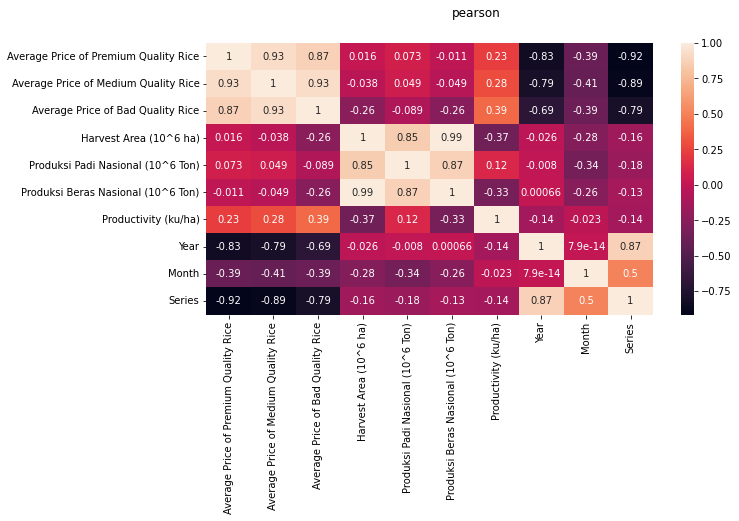

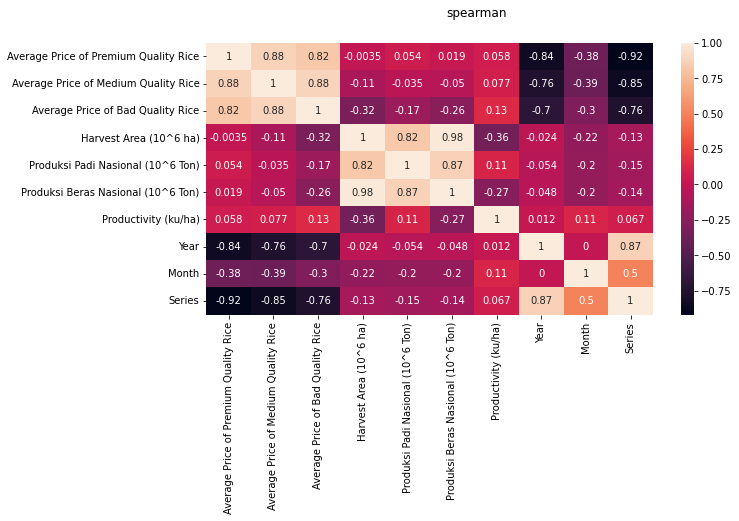

In [27]:
items = ['pearson', 'spearman']
for item in items:
    fig, axe = plt.subplots(figsize=(10,5))
    fig.suptitle(item)
    sns.heatmap(df.corr(method=item, numeric_only=True), annot=True)
    plt.show()


# 4.1 Correlation for Average Price of Premium Quality Rice

In [28]:
df.corr(method='pearson', numeric_only=True).sort_values('Average Price of Premium Quality Rice', ascending=False)['Average Price of Premium Quality Rice']

Average Price of Premium Quality Rice    1.000000
Average Price of Medium Quality Rice     0.927048
Average Price of Bad Quality Rice        0.871458
Productivity (ku/ha)                     0.227642
Produksi Padi Nasional (10^6 Ton)        0.073470
Harvest Area (10^6 ha)                   0.015777
Produksi Beras Nasional (10^6 Ton)      -0.010586
Month                                   -0.393286
Year                                    -0.830722
Series                                  -0.916181
Name: Average Price of Premium Quality Rice, dtype: float64

By using Pearson, It seems like Average Price of Medium Quality Rice, Average Price of Bad Quality Rice, and Productivity (ku/ha) have a positive correlation with Average Price of Premium Quality Rice

In [29]:
df.corr(method='spearman', numeric_only=True).sort_values('Average Price of Premium Quality Rice', ascending=False)['Average Price of Premium Quality Rice']

Average Price of Premium Quality Rice    1.000000
Average Price of Medium Quality Rice     0.877391
Average Price of Bad Quality Rice        0.823478
Productivity (ku/ha)                     0.058261
Produksi Padi Nasional (10^6 Ton)        0.053560
Produksi Beras Nasional (10^6 Ton)       0.019135
Harvest Area (10^6 ha)                  -0.003480
Month                                   -0.378380
Year                                    -0.842701
Series                                  -0.919130
Name: Average Price of Premium Quality Rice, dtype: float64

Using Spearman, the features correlated with the Average Price of Premium Quality Rice are similar

# 4.2 Correlation for Average Price of Medium Quality Rice

In [30]:
df.corr(method='pearson', numeric_only=True).sort_values('Average Price of Medium Quality Rice', ascending=False)['Average Price of Medium Quality Rice']

Average Price of Medium Quality Rice     1.000000
Average Price of Bad Quality Rice        0.930918
Average Price of Premium Quality Rice    0.927048
Productivity (ku/ha)                     0.283511
Produksi Padi Nasional (10^6 Ton)        0.049413
Harvest Area (10^6 ha)                  -0.037723
Produksi Beras Nasional (10^6 Ton)      -0.049327
Month                                   -0.410702
Year                                    -0.794014
Series                                  -0.893049
Name: Average Price of Medium Quality Rice, dtype: float64

By using Pearson, It seems like Average Price of Premium Quality Rice, Average Price of Bad Quality Rice, and Productivity (ku/ha) have a positive correlation with Average Price of Medium Quality Rice

In [31]:
df.corr(method='spearman', numeric_only=True).sort_values('Average Price of Medium Quality Rice', ascending=False)['Average Price of Medium Quality Rice']

Average Price of Medium Quality Rice     1.000000
Average Price of Bad Quality Rice        0.882609
Average Price of Premium Quality Rice    0.877391
Productivity (ku/ha)                     0.077391
Produksi Padi Nasional (10^6 Ton)       -0.034836
Produksi Beras Nasional (10^6 Ton)      -0.050011
Harvest Area (10^6 ha)                  -0.114398
Month                                   -0.390585
Year                                    -0.758431
Series                                  -0.852174
Name: Average Price of Medium Quality Rice, dtype: float64

By using spearman, most of the correlated features with Average Price of Medium Quality Rice Rice are similar

# 4.3 Correlation for Average Price of Bad Quality Rice

In [32]:
df.corr(method='pearson', numeric_only=True).sort_values('Average Price of Bad Quality Rice', ascending=False)['Average Price of Bad Quality Rice']

Average Price of Bad Quality Rice        1.000000
Average Price of Medium Quality Rice     0.930918
Average Price of Premium Quality Rice    0.871458
Productivity (ku/ha)                     0.394887
Produksi Padi Nasional (10^6 Ton)       -0.088542
Harvest Area (10^6 ha)                  -0.256293
Produksi Beras Nasional (10^6 Ton)      -0.259642
Month                                   -0.389132
Year                                    -0.692158
Series                                  -0.794006
Name: Average Price of Bad Quality Rice, dtype: float64

By using Pearson, It seems like Average Price of Premium Quality Rice, Average Price of Medium Quality Rice, and Productivity (ku/ha) have a positive correlation with Average Price of Bad Quality Rice

In [33]:
df.corr(method='spearman', numeric_only=True).sort_values('Average Price of Bad Quality Rice', ascending=False)['Average Price of Bad Quality Rice']

Average Price of Bad Quality Rice        1.000000
Average Price of Medium Quality Rice     0.882609
Average Price of Premium Quality Rice    0.823478
Productivity (ku/ha)                     0.134783
Produksi Padi Nasional (10^6 Ton)       -0.171130
Produksi Beras Nasional (10^6 Ton)      -0.257882
Month                                   -0.303401
Harvest Area (10^6 ha)                  -0.317094
Year                                    -0.698238
Series                                  -0.756522
Name: Average Price of Bad Quality Rice, dtype: float64

By using spearman, most of the correlated features with Average Price of Bad Quality Rice Rice are similar

# 5. Split dataset to train and test datasets
    df_train is rice data from 2020
    df_test is rice data in 2021

In [34]:
df_train = df.iloc[:12,:]
df_test = df.iloc[12:,:]

In [35]:
# Training data
Series_train = df_train.loc[:, ['Series']]  # features
Monthly_train = df_train.loc[:, ['Month']]  # features
x_premium_train = df_train.loc[:, df_train.columns != 'Average Price of Premium Quality Rice'] # features
x_medium_train = df_train.loc[:, df_train.columns != 'Average Price of Medium Quality Rice'] # features
x_bad_train = df_train.loc[:, df_train.columns != 'Average Price of Bad Quality Rice'] # features
HargaBerasPremium_train = df_train.loc[:, 'Average Price of Premium Quality Rice']  # target
HargaBerasMedium_train = df_train.loc[:, 'Average Price of Medium Quality Rice']  # target
HargaBerasLuarkualitas_train = df_train.loc[:, 'Average Price of Bad Quality Rice'] # target

In [36]:
# Test Data
Series_test = df_test.loc[:, ['Series']]  # features
Monthly_test = df_test.loc[:, ['Month']]  # features
x_premium_test = df_test.loc[:, df_test.columns != 'Average Price of Premium Quality Rice'] # features
x_medium_test = df_test.loc[:, df_test.columns != 'Average Price of Medium Quality Rice'] # features
x_bad_test = df_test.loc[:, df_test.columns != 'Average Price of Bad Quality Rice'] # features
HargaBerasPremium_test = df_test.loc[:, 'Average Price of Premium Quality Rice']  # target
HargaBerasMedium_test = df_test.loc[:, 'Average Price of Medium Quality Rice']  # target
HargaBerasLuarkualitas_test = df_test.loc[:, 'Average Price of Bad Quality Rice'] # target

In [37]:
evaluation_train = {}
evaluation_test = {}

### SIMPLE LINEAR REGRESSION
### Average Price of Premium Quality Rice

In [38]:
# Train the model
model = LinearRegression()
model.fit(Series_train, HargaBerasPremium_train)

# Koefisien model
print ('Coefficients: ', model.coef_)
print ('Intercept: ',model.intercept_)
accuracy = model.score(Series_train, HargaBerasPremium_train)
print("Model Accuracy: ", accuracy)

Coefficients:  [-0.96750371]
Intercept:  0.9928285950802902
Model Accuracy:  0.7385847672120972


Predicting on Train Data

In [39]:
AvgPricePremium_train = pd.Series(model.predict(Series_train), index=Series_train.index)

eval(evaluation_train,HargaBerasPremium_train,AvgPricePremium_train,'Train SLR Premium')

Predicting on Test Data

In [40]:
AvgPricePremium_pred = pd.Series(model.predict(Series_test), index=Series_test.index)

eval(evaluation_test,HargaBerasPremium_test,AvgPricePremium_pred,'Test SLR Premium')

### Multiple Linear Regression
### Average Price of Premium Quality Rice

In [41]:
regr = LinearRegression()
regr.fit(x_premium_train,HargaBerasPremium_train)

print('Coefficients: ', regr.coef_)
print ('Intercept: ',regr.intercept_)

accuracy = regr.score(x_premium_train,HargaBerasPremium_train)
print("Model Accuracy: ", accuracy)

Coefficients:  [-1.26194281  0.72589194 -0.5323471  -0.33496796  1.23483454  0.41694958
  0.         -0.67433142 -0.32250633]
Intercept:  1.2600853809328438
Model Accuracy:  0.9149158449946824


Predicting on Train Data

In [42]:
AvgPricePremium_train_v2 = pd.Series(regr.predict(x_premium_train), index=x_premium_train.index)

eval(evaluation_train,HargaBerasPremium_train,AvgPricePremium_train_v2,'Train MLR Premium')

Predicting on Test Data

In [43]:
AvgPricePremium_pred_v2 = pd.Series(regr.predict(x_premium_test), index=x_premium_test.index)

eval(evaluation_test,HargaBerasPremium_test,AvgPricePremium_pred_v2,'Test MLR Premium')

explain the model's predictions using SHAP

Shapley on Train Data

In [44]:
explainer = shap.Explainer(regr, x_premium_train)
shap_values = explainer(x_premium_train)

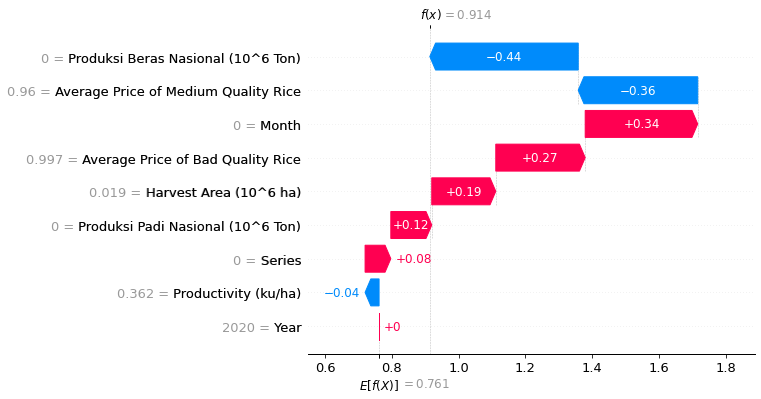

In [45]:
shap.plots.waterfall(shap_values[0])

In [46]:
shap_values = explainer.shap_values(x_premium_train)

In [47]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, x_premium_train,link="logit")

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


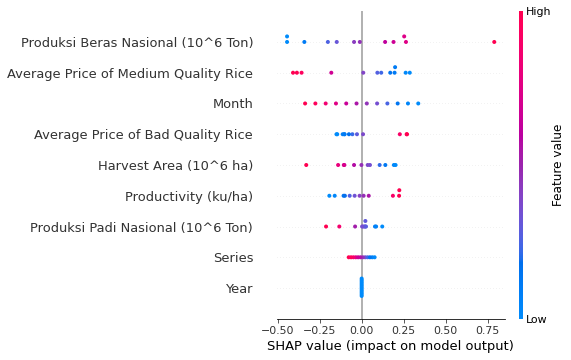

In [48]:
shap.summary_plot(shap_values, x_premium_train)

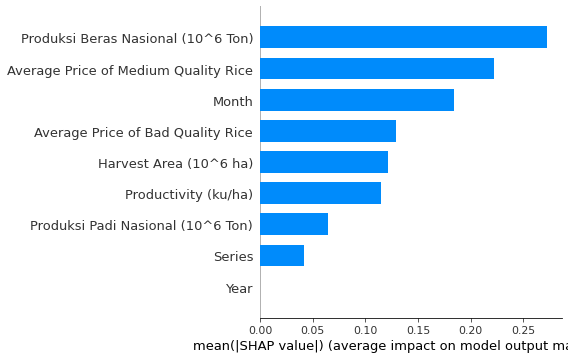

In [49]:
shap.summary_plot(shap_values, x_premium_train, plot_type ="bar")

    The feature important that has the largest average SHAP value in the Multiple Linear Regression method on Average Price of Premium Quality Rice is  Produksi Beras Nasional. High values of the Produksi Beras Nasional variable have a high positive contribution on the prediction, while low values have a high negative contribution.

Shapley on Test Data

In [50]:
explainer = shap.Explainer(regr, x_premium_test)
shap_values = explainer(x_premium_test)

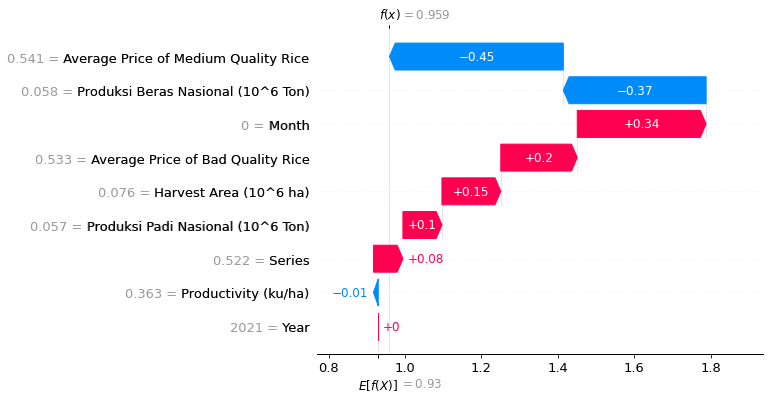

In [51]:
shap.plots.waterfall(shap_values[0])

In [52]:
shap_values = explainer.shap_values(x_premium_test)

In [53]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, x_premium_test,link="logit")

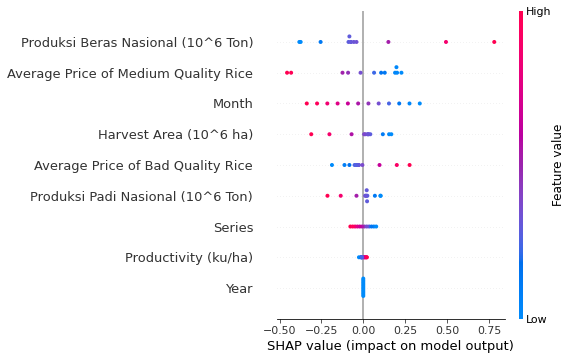

In [54]:
shap.summary_plot(shap_values, x_premium_test)

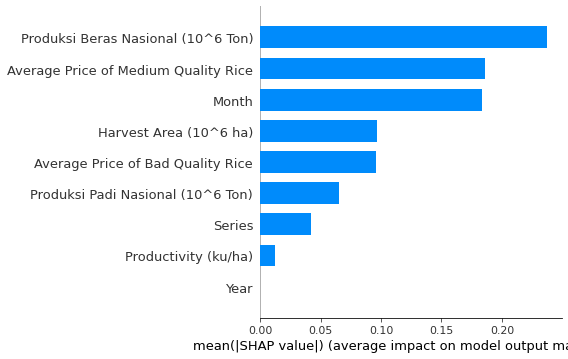

In [55]:
shap.summary_plot(shap_values, x_premium_test, plot_type ="bar")

    The feature important that has the largest average SHAP value in the Multiple Linear Regression method on Average Price of Premium Quality Rice is  Produksi Beras Nasional. High values of the Produksi Beras Nasional variable have a high positive contribution on the prediction, while low values have a high negative contribution.

## explain the model's predictions using Lime

In [56]:
# Create the Explainer
explainer = lime.lime_tabular.LimeTabularExplainer(x_premium_train.values, feature_names=x_premium_train.columns.values.tolist(),
                                                  class_names=['Average Price of Premium Quality Rice'], verbose=True, mode='regression')

In [57]:
# Choose the 5th instance and use it to predict the results
j = 5
exp = explainer.explain_instance(x_premium_test.values[j], regr.predict, num_features=len(x_premium_test.columns.values.tolist()))

Intercept 0.7640182871797225
Prediction_local [0.92447736]
Right: 1.0926096110356518


X does not have valid feature names, but LinearRegression was fitted with feature names


In [58]:
# Show the predictions
exp.show_in_notebook(show_table=True)

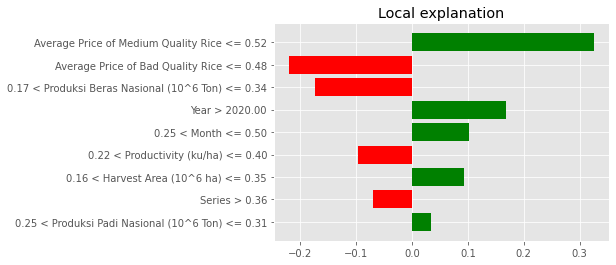

In [59]:
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()

In [60]:
exp.as_list()

[('Average Price of Medium Quality Rice <= 0.52', 0.3250403372972888),
 ('Average Price of Bad Quality Rice <= 0.48', -0.21971630483789095),
 ('0.17 < Produksi Beras Nasional (10^6 Ton) <= 0.34', -0.17456359410800865),
 ('Year > 2020.00', 0.16813225549859676),
 ('0.25 < Month <= 0.50', 0.10106441904866131),
 ('0.22 < Productivity (ku/ha) <= 0.40', -0.0968957224937754),
 ('0.16 < Harvest Area (10^6 ha) <= 0.35', 0.09281309288765258),
 ('Series > 0.36', -0.06948794920524015),
 ('0.25 < Produksi Padi Nasional (10^6 Ton) <= 0.31', 0.03407253427004729)]

## Random Forest
### Average Price of Premium Quality Rice

In [61]:
# Train the model
regressor = RandomForestRegressor(n_estimators = 1000, random_state=42)
regressor.fit(x_premium_train,HargaBerasPremium_train)

accuracy = regressor.score(x_premium_train,HargaBerasPremium_train)
print("Model Accuracy: ", accuracy)

Model Accuracy:  0.9550472985804614


Predicting on Train Data

In [62]:
AvgPricePremium_train_with_randomforest = pd.Series(regressor.predict(x_premium_train), index=x_premium_train.index)

eval(evaluation_train,HargaBerasPremium_train,AvgPricePremium_train_with_randomforest,'Train RF Premium')

Predicting on Test Data

In [63]:
AvgPricePremium_pred_with_randomforest = pd.Series(regressor.predict(x_premium_test), index=x_premium_test.index)

eval(evaluation_test,HargaBerasPremium_test,AvgPricePremium_pred_with_randomforest,'Test RF Premium')

# explain the model's predictions using SHAP

In [64]:
explainer = shap.TreeExplainer(regressor)

Shap Explanation at Train Data

In [65]:
shap_values = explainer.shap_values(x_premium_train)

In [66]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values,x_premium_train,link="logit")

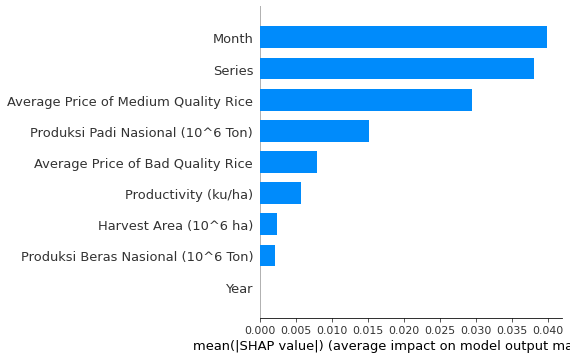

In [67]:
shap.summary_plot(shap_values, x_premium_train, plot_type="bar")

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


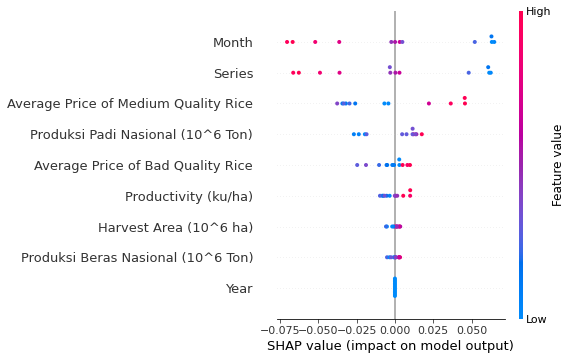

In [68]:
shap.summary_plot(shap_values, x_premium_train)

    The feature important that has the largest average SHAP value in the Random Forest Regression method on Average Price of Premium Quality Rice is Time. High values of the Time variable have a high negative contribution on the prediction, while low values have a high positive contribution.

Shap Explanation at Test Data

In [69]:
shap_values = explainer.shap_values(x_premium_test)

In [70]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values,x_premium_test,link="logit")

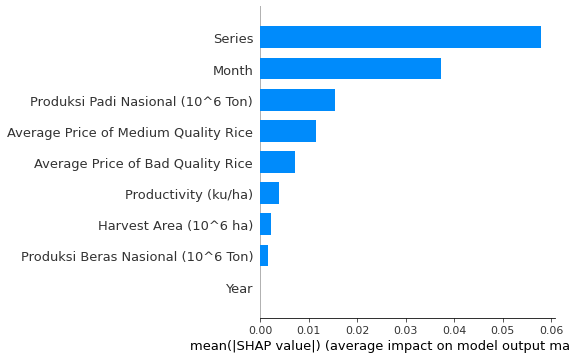

In [71]:
shap.summary_plot(shap_values, x_premium_test, plot_type="bar")

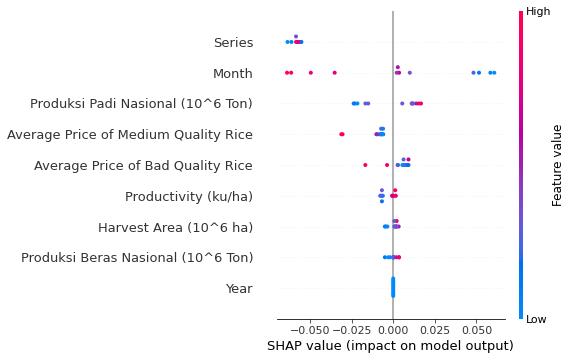

In [72]:
shap.summary_plot(shap_values, x_premium_test)

    The feature important that has the largest average SHAP value in the Random Forest Regression method on Average Price of Premium Quality Rice is Time. High values of the Month variable have a high negative contribution on the prediction, while low values have a high positive contribution.

### explain the model's predictions using Lime

In [73]:
# Create the Explainer
explainer = lime.lime_tabular.LimeTabularExplainer(x_premium_train.values, feature_names=x_premium_train.columns.values.tolist(),
                                                  class_names=['Average Price of Premium Quality Rice'], verbose=True, mode='regression')

In [74]:
# Choose the 5th instance and use it to predict the results
j = 5
exp = explainer.explain_instance(x_premium_test.values[j], regressor.predict, num_features=len(x_premium_test.columns.values.tolist()))

X does not have valid feature names, but RandomForestRegressor was fitted with feature names


Intercept 0.7704320250596443
Prediction_local [0.69966769]
Right: 0.7064025146147332


In [75]:
# Show the predictions
exp.show_in_notebook(show_table=True)

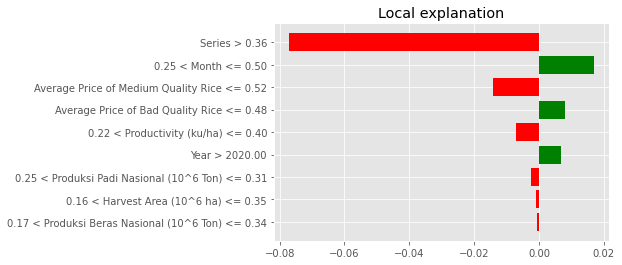

In [76]:
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()

In [77]:
exp.as_list()

[('Series > 0.36', -0.07700558066795461),
 ('0.25 < Month <= 0.50', 0.016872804571422966),
 ('Average Price of Medium Quality Rice <= 0.52', -0.014244505020606625),
 ('Average Price of Bad Quality Rice <= 0.48', 0.007958029147879967),
 ('0.22 < Productivity (ku/ha) <= 0.40', -0.007093383070329911),
 ('Year > 2020.00', 0.0067348207906039),
 ('0.25 < Produksi Padi Nasional (10^6 Ton) <= 0.31', -0.002466599955512921),
 ('0.16 < Harvest Area (10^6 ha) <= 0.35', -0.0009046884416589535),
 ('0.17 < Produksi Beras Nasional (10^6 Ton) <= 0.34', -0.0006152285893586763)]

### SIMPLE LINEAR REGRESSION
### Average Price of Medium Quality Rice

In [78]:
# Train the model
model2 = LinearRegression()
model2.fit(Series_train, HargaBerasMedium_train)

# Koefisien model
print ('Coefficients: ', model2.coef_)
print ('Intercept: ',model2.intercept_)

Coefficients:  [-1.12286983]
Intercept:  0.9442955997232406


Predicting on Train Data

In [79]:
AvgPriceMedium_train = pd.Series(model2.predict(Series_train), index=Series_train.index)

eval(evaluation_train,HargaBerasMedium_train,AvgPriceMedium_train,'Train SLR Medium')

Predicting on Test Data

In [80]:
AvgPriceMedium_pred = pd.Series(model2.predict(Series_test), index=Series_test.index)

eval(evaluation_test,HargaBerasMedium_test,AvgPriceMedium_pred,'Test SLR Medium')

### Multiple Linear Regression
### Average Price of Medium Quality Rice

In [81]:
regr_v2 = LinearRegression()
regr_v2.fit(x_medium_train, HargaBerasMedium_train)

print('Coefficients: ', regr_v2.coef_)
print ('Intercept: ',regr_v2.intercept_)

accuracy = regr_v2.score(x_medium_train,HargaBerasMedium_train)
print("Model Accuracy: ", accuracy)

Coefficients:  [-3.81030320e-01  5.42401850e-01 -6.29392741e-01 -3.02491739e-01
  1.14688614e+00  2.76904002e-01 -2.22044605e-16 -4.10665330e-01
 -1.96405158e-01]
Intercept:  0.6863065591276458
Model Accuracy:  0.9815094839906329


Predicting on Train Data

In [82]:
AvgPriceMedium_train_v2 = pd.Series(regr_v2.predict(x_medium_train), index=x_medium_train.index)

eval(evaluation_train,HargaBerasMedium_train,AvgPriceMedium_train_v2,'Train MLR Medium')

Predicting on Test Data

In [83]:
AvgPriceMedium_pred_v2 = pd.Series(regr_v2.predict(x_medium_test), index=x_medium_test.index)

eval(evaluation_test,HargaBerasMedium_test,AvgPriceMedium_pred_v2,'Test MLR Medium')

explain the model's predictions using SHAP

Shapley on Train Data

In [84]:
explainer = shap.LinearExplainer(regr_v2, x_medium_train)
shap_values = explainer(x_medium_train)

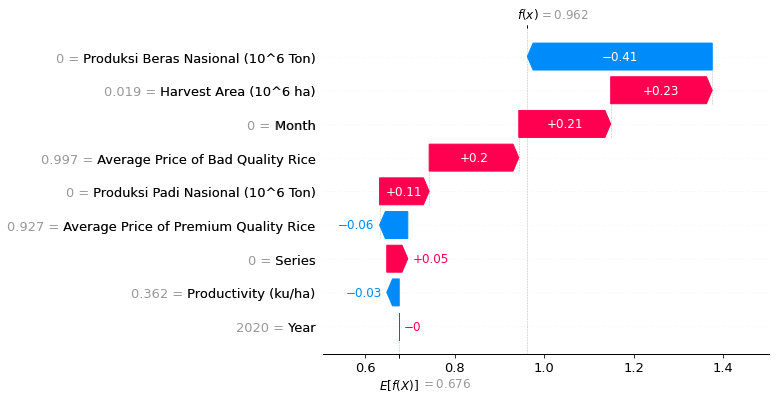

In [85]:
shap.plots.waterfall(shap_values[0])

In [86]:
shap_values_v2 = explainer.shap_values(x_medium_train)

In [87]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values_v2, x_medium_train,link="logit")

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


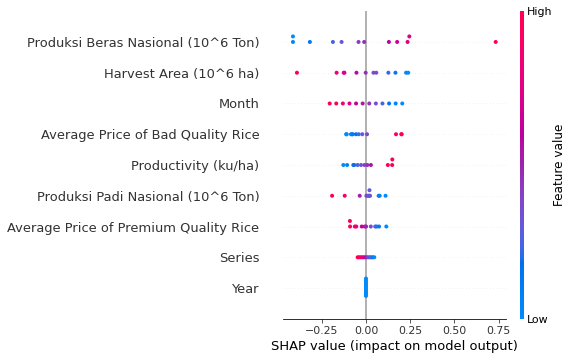

In [88]:
shap.summary_plot(shap_values_v2, x_medium_train)

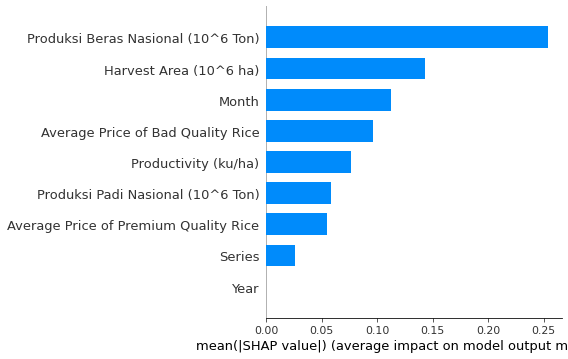

In [89]:
shap.summary_plot(shap_values_v2, x_medium_test, plot_type ="bar")

    The feature important that has the largest average SHAP value in the Multiple Linear Regression method on Average Price of Medium Quality Rice is  Produksi Beras Nasional. High values of the Produksi Beras Nasional variable have a high positive contribution on the prediction, while low values have a high negative contribution.

Shapley on Test Data

In [90]:
explainer_v2 = shap.LinearExplainer(regr_v2, x_medium_test)
shap_values_v2 = explainer_v2(x_medium_test)

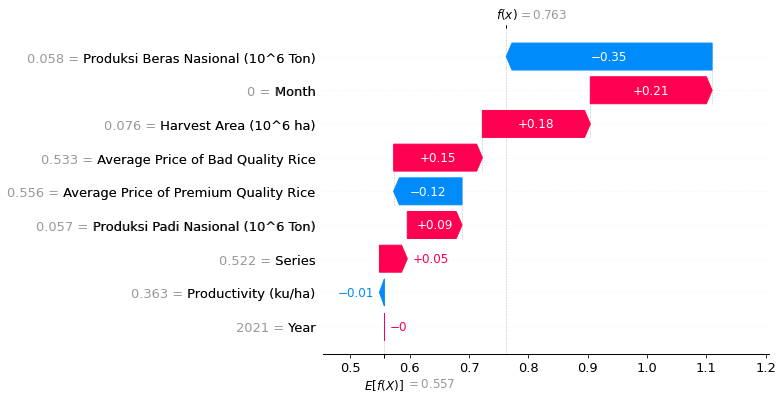

In [91]:
shap.plots.waterfall(shap_values_v2[0])

In [92]:
shap_values_v2 = explainer_v2.shap_values(x_medium_test)

In [93]:
shap.initjs()
shap.force_plot(explainer_v2.expected_value, shap_values_v2, x_medium_test,link="logit")

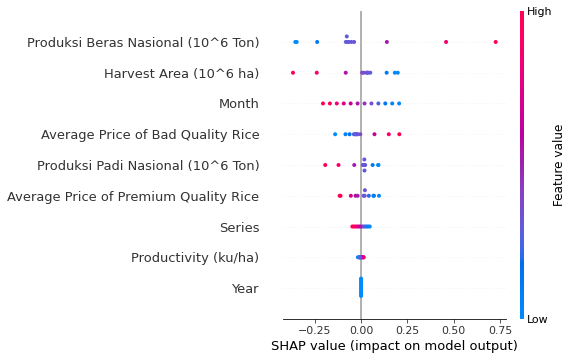

In [94]:
shap.summary_plot(shap_values_v2, x_medium_test)

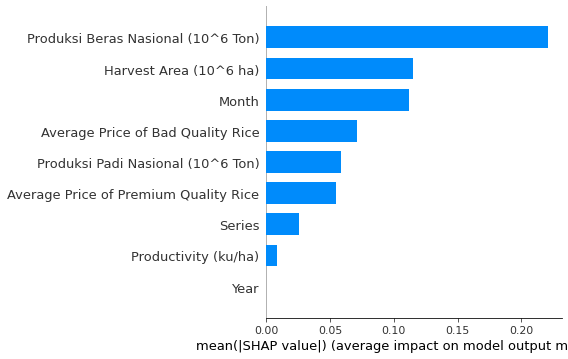

In [95]:
shap.summary_plot(shap_values_v2, x_medium_test, plot_type ="bar")

    The feature important that has the largest average SHAP value in the Multiple Linear Regression method on Average Price of Medium Quality Rice is  Produksi Beras Nasional. High values of the Produksi Beras Nasional variable have a high positive contribution on the prediction, while low values have a high negative contribution.

## explain the model's predictions using Lime

In [96]:
# Create the Explainer
explainer = lime.lime_tabular.LimeTabularExplainer(x_medium_train.values, feature_names=x_medium_train.columns.values.tolist(),
                                                  class_names=['Average Price of Medium Quality Rice'], verbose=True, mode='regression')

In [97]:
# Choose the 5th instance and use it to predict the results
j = 5
exp = explainer.explain_instance(x_medium_test.values[j], regr_v2.predict, num_features=len(x_medium_test.columns.values.tolist()))

Intercept 0.7131348990425578
Prediction_local [0.58472828]
Right: 0.545006234105518


X does not have valid feature names, but LinearRegression was fitted with feature names


In [98]:
# Show the predictions
exp.show_in_notebook(show_table=True)

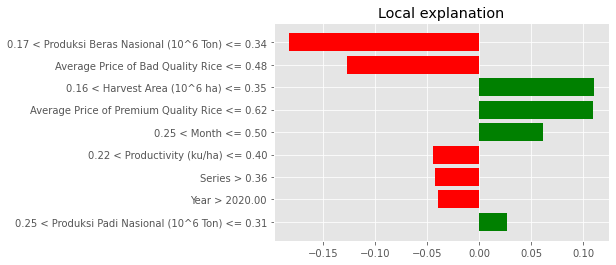

In [99]:
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()

In [100]:
exp.as_list()

[('0.17 < Produksi Beras Nasional (10^6 Ton) <= 0.34', -0.1826876481885024),
 ('Average Price of Bad Quality Rice <= 0.48', -0.12703402807551856),
 ('0.16 < Harvest Area (10^6 ha) <= 0.35', 0.11009676522727882),
 ('Average Price of Premium Quality Rice <= 0.62', 0.10924614845466277),
 ('0.25 < Month <= 0.50', 0.06168295380854463),
 ('0.22 < Productivity (ku/ha) <= 0.40', -0.044413348834962),
 ('Series > 0.36', -0.04267581358671607),
 ('Year > 2020.00', -0.03972204870757961),
 ('0.25 < Produksi Padi Nasional (10^6 Ton) <= 0.31', 0.02710040367333137)]

## Random Forest
### Average Price of Medium Quality Rice

In [101]:
# Train the model
regressor2 = RandomForestRegressor(n_estimators = 1000, random_state=42)
regressor2.fit(x_medium_train, HargaBerasMedium_train)

accuracy = regressor2.score(x_medium_train, HargaBerasMedium_train)
print("Model Accuracy: ", accuracy)

Model Accuracy:  0.9818019329713068


Predicting on Train Data

In [102]:
AvgPriceMedium_train_with_randomforest = pd.Series(regressor2.predict(x_medium_train), index=x_medium_train.index)

eval(evaluation_train,HargaBerasMedium_train,AvgPriceMedium_train_with_randomforest,'Train RF Medium')

Predicting on Test Data

In [103]:
AvgPriceMedium_pred_with_randomforest = pd.Series(regressor2.predict(x_medium_test), index=x_medium_test.index)

eval(evaluation_test,HargaBerasMedium_test,AvgPriceMedium_pred_with_randomforest,'Test RF Medium')

Explain the model's predictions using SHAP

In [104]:
explainer = shap.TreeExplainer(regressor2)

Shapley on Train Data

In [105]:
shap_values = explainer.shap_values(x_medium_train)

In [106]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, x_medium_train,link="logit")

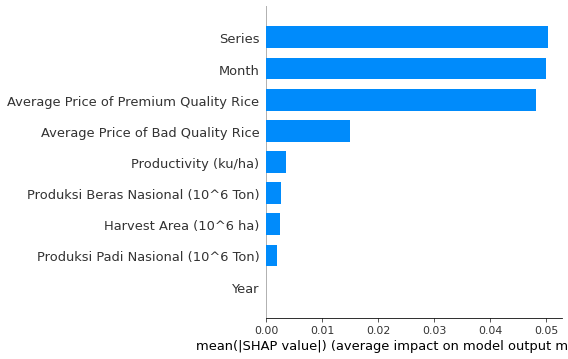

In [107]:
shap.summary_plot(shap_values, x_medium_train, plot_type="bar")

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


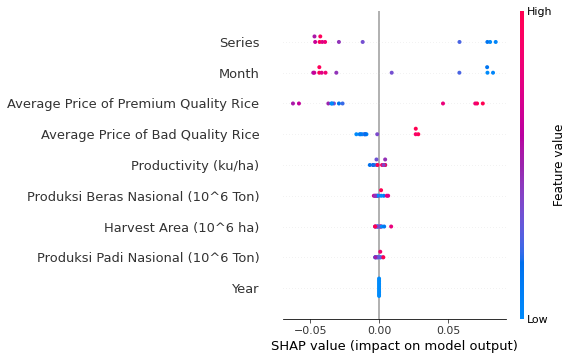

In [108]:
shap.summary_plot(shap_values, x_medium_train)

    The feature important that has the largest average SHAP value in the Random Forest Regression method on Average Price of Medium Quality Rice is Time. High values of the Time variable have a high negative contribution on the prediction, while low values have a high positive contribution.

Shapley on Test Data

In [109]:
shap_values = explainer.shap_values(x_medium_test)

In [110]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, x_medium_test,link="logit")

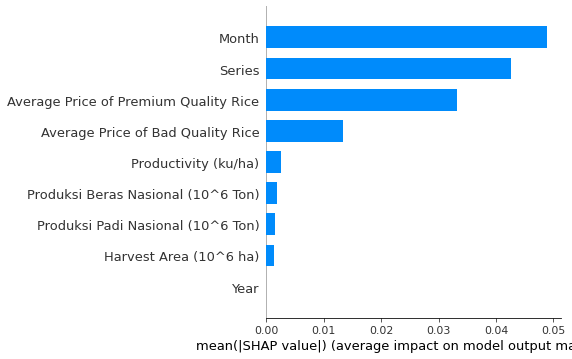

In [111]:
shap.summary_plot(shap_values, x_medium_test, plot_type="bar")

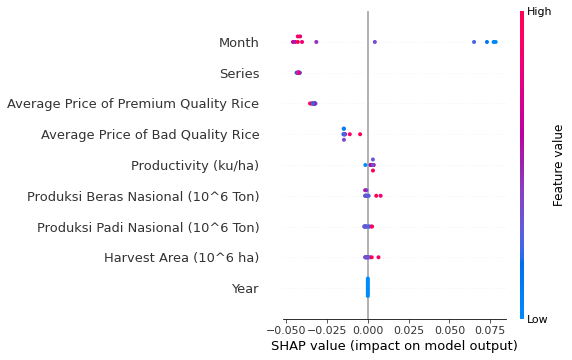

In [112]:
shap.summary_plot(shap_values, x_medium_test)

    The feature important that has the largest average SHAP value in the Random Forest Regression method on Average Price of Medium Quality Rice is Month. High values of the Month variable have a high negative contribution on the prediction, while low values have a high positive contribution.

## explain the model's predictions using Lime

In [113]:
# Create the Explainer
explainer = lime.lime_tabular.LimeTabularExplainer(x_medium_train.values, feature_names=x_medium_train.columns.values.tolist(),
                                                  class_names=['Average Price of Medium Quality Rice'], verbose=True, mode='regression')

In [114]:
# Choose the 5th instance and use it to predict the results
j = 5
exp = explainer.explain_instance(x_medium_test.values[j], regressor2.predict, num_features=len(x_medium_test.columns.values.tolist()))

X does not have valid feature names, but RandomForestRegressor was fitted with feature names


Intercept 0.6922037880580375
Prediction_local [0.56684717]
Right: 0.5547457350897963


In [115]:
# Show the predictions
exp.show_in_notebook(show_table=True)

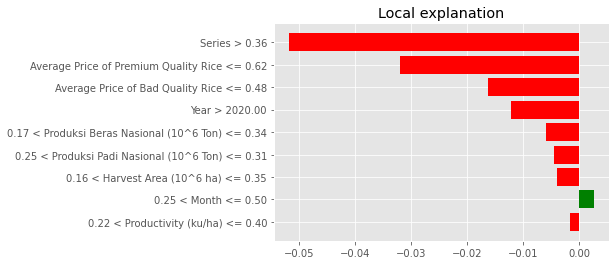

In [116]:
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()

In [117]:
exp.as_list()

[('Series > 0.36', -0.05178329635934205),
 ('Average Price of Premium Quality Rice <= 0.62', -0.032006882487597116),
 ('Average Price of Bad Quality Rice <= 0.48', -0.016330765424736403),
 ('Year > 2020.00', -0.012101430948966877),
 ('0.17 < Produksi Beras Nasional (10^6 Ton) <= 0.34', -0.005820068942187645),
 ('0.25 < Produksi Padi Nasional (10^6 Ton) <= 0.31', -0.004523087134414644),
 ('0.16 < Harvest Area (10^6 ha) <= 0.35', -0.003924004253294725),
 ('0.25 < Month <= 0.50', 0.002636896771016239),
 ('0.22 < Productivity (ku/ha) <= 0.40', -0.0015039832397515333)]

### SIMPLE LINEAR REGRESSION
### Average Price of Bad Quality Rice

In [118]:
# Train the model
model3 = LinearRegression()
model3.fit(Series_train, HargaBerasLuarkualitas_train)

# Koefisien model
print ('Coefficients: ', model3.coef_)
print ('Intercept: ',model3.intercept_)

accuracy = model3.score(Series_train,HargaBerasLuarkualitas_train)
print("Model Accuracy: ", accuracy)

Coefficients:  [-0.84411113]
Intercept:  0.8298039096822396
Model Accuracy:  0.3577038249079444


Predicting on Train Data

In [119]:
AvgPriceBad_train = pd.Series(model3.predict(Series_train), index=Series_train.index)

eval(evaluation_train,HargaBerasLuarkualitas_train,AvgPriceBad_train,'Train SLR Bad')

Predicting on Test Data

In [120]:
AvgPriceBad_pred = pd.Series(model3.predict(Series_test), index=Series_test.index)

eval(evaluation_test,HargaBerasLuarkualitas_test,AvgPriceBad_pred,'Test SLR Bad')

### Multiple Linear Regression
### Average Price of Bad Quality Rice

In [121]:
regr_v3 = LinearRegression()
regr_v3.fit(x_bad_train,HargaBerasLuarkualitas_train)

print('Coefficients: ', regr_v3.coef_)
print ('Intercept: ',regr_v3.intercept_)

accuracy = regr_v3.score(x_bad_train,HargaBerasLuarkualitas_train)
print("Model Accuracy: ", accuracy)

Coefficients:  [ 0.58831158  1.45591736  0.30807929  0.45515993 -1.14551679 -0.39723509
  0.          0.52017312  0.24877845]
Intercept:  -0.8110288169963534
Model Accuracy:  0.9561253792084915


Predicting on Train Data

In [122]:
AvgPriceBad_train_v2 = pd.Series(regr_v3.predict(x_bad_train), index=x_bad_train.index)

eval(evaluation_train,HargaBerasLuarkualitas_train,AvgPriceBad_train_v2,'Train MLR Bad')

Predicting on Test Data

In [123]:
AvgPriceBad_pred_v2 = pd.Series(regr_v3.predict(x_bad_test), index=x_bad_test.index)

eval(evaluation_test,HargaBerasLuarkualitas_test,AvgPriceBad_pred_v2,'Test MLR Bad')

Explain the model's predictions using SHAP

Shapley on Train Data

In [124]:
explainer = shap.LinearExplainer(regr_v3, x_bad_train)
shap_values = explainer(x_bad_train)

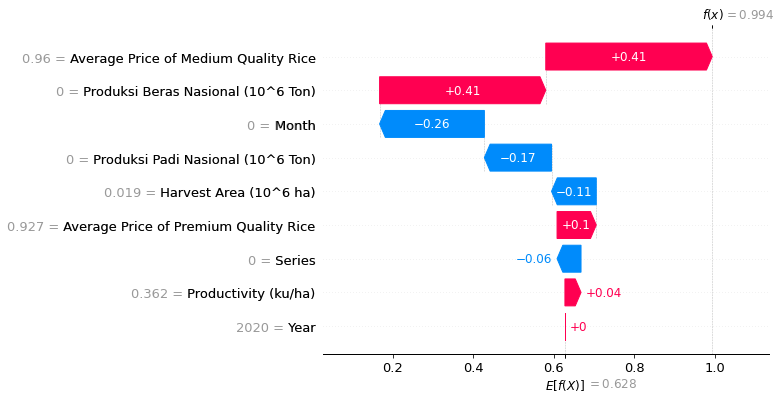

In [125]:
shap.plots.waterfall(shap_values[0])

In [126]:
shap_values = explainer.shap_values(x_bad_train)

In [127]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, x_bad_train,link="logit")

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


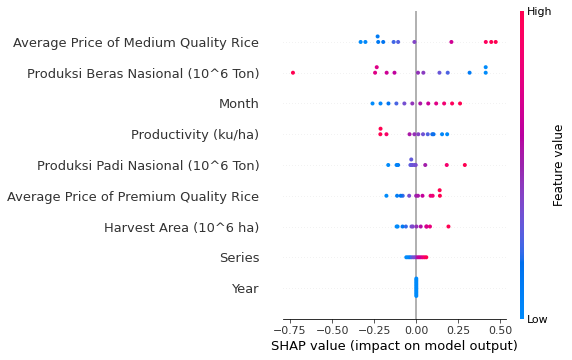

In [128]:
shap.summary_plot(shap_values, x_bad_train)

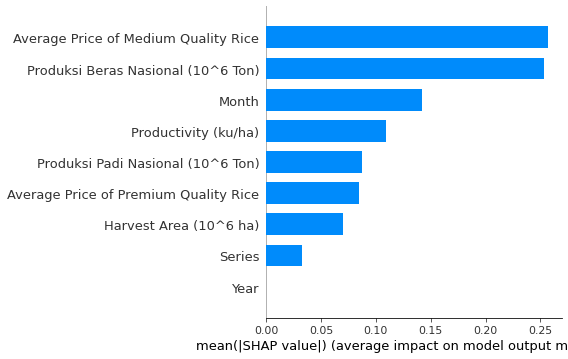

In [129]:
shap.summary_plot(shap_values, x_bad_train, plot_type ="bar")

    The feature important that has the largest average SHAP value in the Multiple Linear Regression method on Average Price of Bad Quality Rice is Average Price of Medium Quality Rice. High values of the Average Price of Medium Quality Rice variable have a high positive contribution on the prediction, while low values have a high negative contribution.

Shapley on Test Data

In [130]:
explainer_v3 = shap.LinearExplainer(regr_v3, x_bad_test)
shap_values_v3 = explainer_v3(x_bad_test)

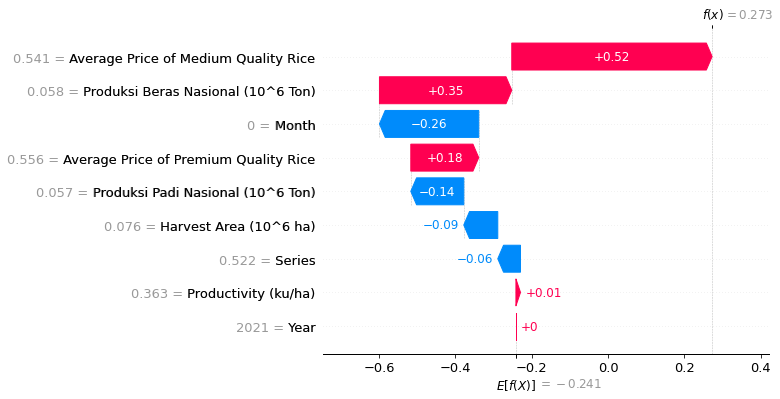

In [131]:
shap.plots.waterfall(shap_values_v3[0])

In [132]:
shap_values_v3 = explainer_v3.shap_values(x_bad_test)

In [133]:
shap.initjs()
shap.force_plot(explainer_v3.expected_value, shap_values_v3, x_bad_test,link="logit")

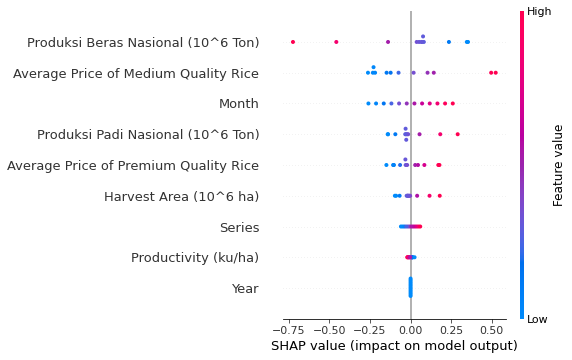

In [134]:
shap.summary_plot(shap_values_v3, x_bad_test)

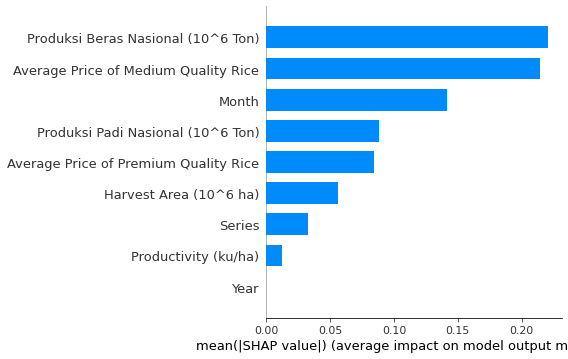

In [135]:
shap.summary_plot(shap_values_v3, x_bad_test, plot_type ="bar")

    The feature important that has the largest average SHAP value in the Multiple Linear Regression method on Bad Quality Rice is Produksi Beras Nasional. High values of the Produksi Beras Nasional variable have a high negative contribution on the prediction, while low values have a high positive contribution.

### explain the model's predictions using Lime

In [136]:
# Create the Explainer
explainer = lime.lime_tabular.LimeTabularExplainer(x_bad_train.values, feature_names=x_bad_train.columns.values.tolist(),
                                                  class_names=['Average Price of Bad Quality Rice'], verbose=True, mode='regression')

In [137]:
# Choose the 5th instance and use it to predict the results
j = 5
exp = explainer.explain_instance(x_bad_test.values[j], regr_v3.predict, num_features=len(x_bad_test.columns.values.tolist()))

Intercept 0.7367601803021137
Prediction_local [-0.11066209]
Right: -0.49923082006086766


X does not have valid feature names, but LinearRegression was fitted with feature names


In [138]:
# Show the predictions
exp.show_in_notebook(show_table=True)

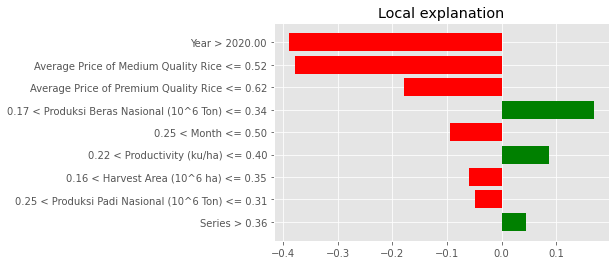

In [139]:
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()

In [140]:
exp.as_list()

[('Year > 2020.00', -0.38856872934723274),
 ('Average Price of Medium Quality Rice <= 0.52', -0.37767710517126013),
 ('Average Price of Premium Quality Rice <= 0.62', -0.17948004924977823),
 ('0.17 < Produksi Beras Nasional (10^6 Ton) <= 0.34', 0.16861321622745112),
 ('0.25 < Month <= 0.50', -0.09391011662509416),
 ('0.22 < Productivity (ku/ha) <= 0.40', 0.08628375798121068),
 ('0.16 < Harvest Area (10^6 ha) <= 0.35', -0.059003258667706684),
 ('0.25 < Produksi Padi Nasional (10^6 Ton) <= 0.31', -0.04770884781080776),
 ('Series > 0.36', 0.044028861647475215)]

## Random Forest
### Average Price of Bad Quality Rice

In [141]:
# Train the model
regressor3 = RandomForestRegressor(n_estimators = 1000, random_state=42)
regressor3.fit(x_bad_train, HargaBerasLuarkualitas_train)

accuracy = regressor3.score(x_bad_train, HargaBerasLuarkualitas_train)
print("Model Accuracy: ", accuracy)

Model Accuracy:  0.9469118732371389


Predicting on Train Data

In [142]:
AvgPriceBad_train_with_randomforest = pd.Series(regressor3.predict(x_bad_train), index=x_bad_train.index)

eval(evaluation_train,HargaBerasLuarkualitas_train,AvgPriceBad_train_with_randomforest,'Train RF Bad')

Predicting on Test Data

In [143]:
AvgPriceBad_pred_with_randomforest = pd.Series(regressor3.predict(x_bad_test), index=x_bad_test.index)

eval(evaluation_test,HargaBerasLuarkualitas_test,AvgPriceBad_pred_with_randomforest,'Test RF Bad')

Explain the model's predictions using SHAP

In [144]:
explainer = shap.TreeExplainer(regressor3)

Shapley on Train Data

In [145]:
shap_values = explainer.shap_values(x_bad_train)

In [146]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, x_bad_train,link="logit")

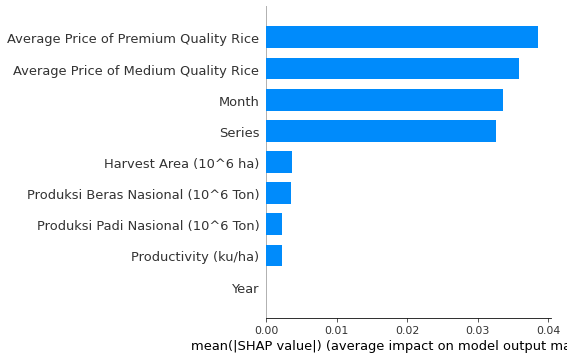

In [147]:
shap.summary_plot(shap_values, x_bad_train, plot_type="bar")

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


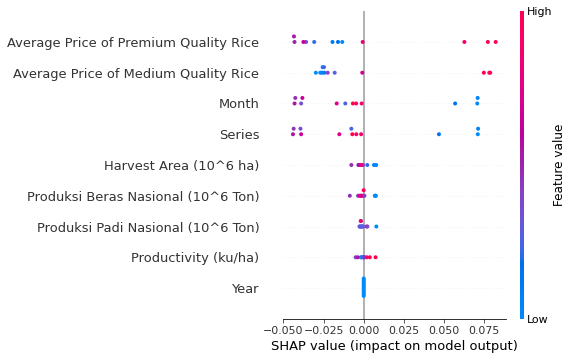

In [148]:
shap.summary_plot(shap_values, x_bad_train)

    The feature important that has the largest average SHAP value in the Random Forest Regression method on Average Price of Bad Quality Rice is Average Price of Medium Quality Rice. High values of the Average Price of Medium Quality Rice variable have a high positive contribution on the prediction, while low values have a high negative contribution.

Shapley on Test Data

In [149]:
shap_values = explainer.shap_values(x_bad_test)

In [150]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, x_bad_test,link="logit")

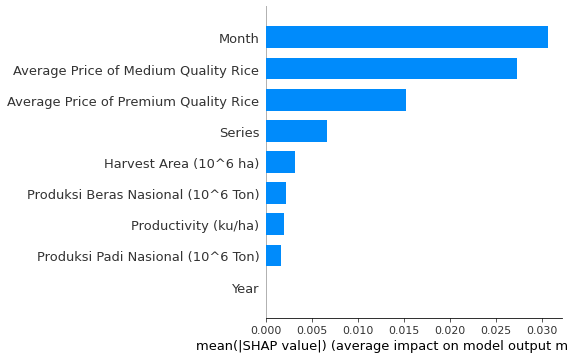

In [151]:
shap.summary_plot(shap_values, x_bad_test, plot_type="bar")

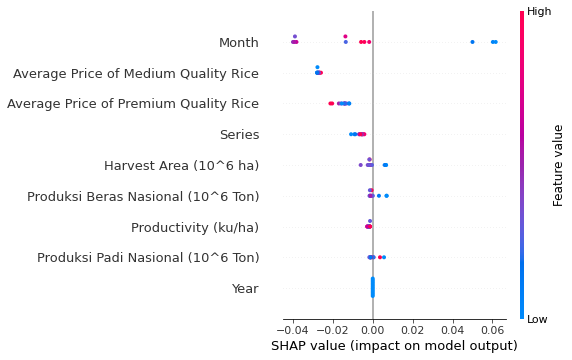

In [152]:
shap.summary_plot(shap_values, x_bad_test)

    The feature important that has the largest average SHAP value in the Random Forest Regression method on Average Price of Bad Quality Rice is Average Price of Medium Quality Rice. 

### explain the model's predictions using Lime

In [153]:
# Create the Explainer
explainer = lime.lime_tabular.LimeTabularExplainer(x_bad_train.values, feature_names=x_bad_train.columns.values.tolist(),
                                                  class_names=['Average Price of Bad Quality Rice'], verbose=True, mode='regression')

In [154]:
# Choose the 5th instance and use it to predict the results
j = 5
exp = explainer.explain_instance(x_bad_test.values[j], regressor3.predict, num_features=len(x_bad_test.columns.values.tolist()))

X does not have valid feature names, but RandomForestRegressor was fitted with feature names


Intercept 0.642017265141245
Prediction_local [0.53458727]
Right: 0.5326342982354934


In [155]:
# Show the predictions
exp.show_in_notebook(show_table=True)

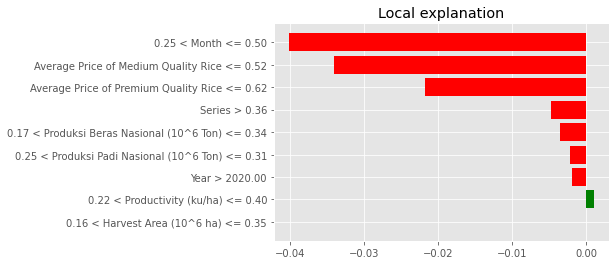

In [156]:
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()

In [157]:
exp.as_list()

[('0.25 < Month <= 0.50', -0.04010513119370269),
 ('Average Price of Medium Quality Rice <= 0.52', -0.034120398332401394),
 ('Average Price of Premium Quality Rice <= 0.62', -0.021789702136239195),
 ('Series > 0.36', -0.004727495134373775),
 ('0.17 < Produksi Beras Nasional (10^6 Ton) <= 0.34', -0.0035306461475622833),
 ('0.25 < Produksi Padi Nasional (10^6 Ton) <= 0.31', -0.00217011330501557),
 ('Year > 2020.00', -0.0019529694579493925),
 ('0.22 < Productivity (ku/ha) <= 0.40', 0.0009690145554502168),
 ('0.16 < Harvest Area (10^6 ha) <= 0.35', -2.556296007754617e-06)]

Returns the MinMaxScaler value to get the actual data 

In [158]:
df[['Average Price of Premium Quality Rice']] = mmscalar_premium.inverse_transform(df[['Average Price of Premium Quality Rice']])

In [159]:
df[['Average Price of Medium Quality Rice']] = mmscalar_medium.inverse_transform(df[['Average Price of Medium Quality Rice']])

In [160]:
df[['Average Price of Bad Quality Rice']] = mmscalar_bad.inverse_transform(df[['Average Price of Bad Quality Rice']])

Premium Rice

In [161]:
HargaBerasPremium_test = HargaBerasPremium_test.to_numpy()
HargaBerasPremium_test = np.reshape(HargaBerasPremium_test, (-1,1)) 
HargaBerasPremium_test = mmscalar_premium.inverse_transform(HargaBerasPremium_test)
HargaBerasPremium_test = np.reshape(HargaBerasPremium_test, (12,))
HargaBerasPremium_test = pd.Series(HargaBerasPremium_test, index=x_premium_test.index)

In [162]:
AvgPricePremium_pred = AvgPricePremium_pred.to_numpy()
AvgPricePremium_pred = np.reshape(AvgPricePremium_pred, (-1,1)) 
AvgPricePremium_pred = mmscalar_premium.inverse_transform(AvgPricePremium_pred)
AvgPricePremium_pred = np.reshape(AvgPricePremium_pred, (12,))
AvgPricePremium_pred = pd.Series(AvgPricePremium_pred, index=x_premium_test.index)

In [163]:
AvgPricePremium_pred_v2 = AvgPricePremium_pred_v2.to_numpy()
AvgPricePremium_pred_v2 = np.reshape(AvgPricePremium_pred_v2, (-1,1)) 
AvgPricePremium_pred_v2 = mmscalar_premium.inverse_transform(AvgPricePremium_pred_v2)
AvgPricePremium_pred_v2 = np.reshape(AvgPricePremium_pred_v2, (12,))
AvgPricePremium_pred_v2 = pd.Series(AvgPricePremium_pred_v2, index=x_premium_test.index)

In [164]:
AvgPricePremium_pred_with_randomforest = AvgPricePremium_pred_with_randomforest.to_numpy()
AvgPricePremium_pred_with_randomforest = np.reshape(AvgPricePremium_pred_with_randomforest, (-1,1)) 
AvgPricePremium_pred_with_randomforest = mmscalar_premium.inverse_transform(AvgPricePremium_pred_with_randomforest)
AvgPricePremium_pred_with_randomforest = np.reshape(AvgPricePremium_pred_with_randomforest, (12,))
AvgPricePremium_pred_with_randomforest = pd.Series(AvgPricePremium_pred_with_randomforest, index=x_premium_test.index)

Medium

In [165]:
HargaBerasMedium_test = HargaBerasMedium_test.to_numpy()
HargaBerasMedium_test = np.reshape(HargaBerasMedium_test, (-1,1)) 
HargaBerasMedium_test = mmscalar_medium.inverse_transform(HargaBerasMedium_test)
HargaBerasMedium_test = np.reshape(HargaBerasMedium_test, (12,))
HargaBerasMedium_test = pd.Series(HargaBerasMedium_test, index=x_medium_test.index)

In [166]:
AvgPriceMedium_pred = AvgPriceMedium_pred.to_numpy()
AvgPriceMedium_pred = np.reshape(AvgPriceMedium_pred, (-1,1)) 
AvgPriceMedium_pred = mmscalar_medium.inverse_transform(AvgPriceMedium_pred)
AvgPriceMedium_pred = np.reshape(AvgPriceMedium_pred, (12,))
AvgPriceMedium_pred = pd.Series(AvgPriceMedium_pred, index=x_medium_test.index)

In [167]:
AvgPriceMedium_pred_v2 = AvgPriceMedium_pred_v2.to_numpy()
AvgPriceMedium_pred_v2 = np.reshape(AvgPriceMedium_pred_v2, (-1,1)) 
AvgPriceMedium_pred_v2 = mmscalar_medium.inverse_transform(AvgPriceMedium_pred_v2)
AvgPriceMedium_pred_v2 = np.reshape(AvgPriceMedium_pred_v2, (12,))
AvgPriceMedium_pred_v2 = pd.Series(AvgPriceMedium_pred_v2, index=x_medium_test.index)

In [168]:
AvgPriceMedium_pred_with_randomforest = AvgPriceMedium_pred_with_randomforest.to_numpy()
AvgPriceMedium_pred_with_randomforest = np.reshape(AvgPriceMedium_pred_with_randomforest, (-1,1)) 
AvgPriceMedium_pred_with_randomforest = mmscalar_medium.inverse_transform(AvgPriceMedium_pred_with_randomforest)
AvgPriceMedium_pred_with_randomforest = np.reshape(AvgPriceMedium_pred_with_randomforest, (12,))
AvgPriceMedium_pred_with_randomforest = pd.Series(AvgPriceMedium_pred_with_randomforest, index=x_medium_test.index)

Bad

In [169]:
HargaBerasLuarkualitas_test= HargaBerasLuarkualitas_test.to_numpy()
HargaBerasLuarkualitas_test= np.reshape(HargaBerasLuarkualitas_test, (-1,1)) 
HargaBerasLuarkualitas_test= mmscalar_bad.inverse_transform(HargaBerasLuarkualitas_test)
HargaBerasLuarkualitas_test= np.reshape(HargaBerasLuarkualitas_test, (12,))
HargaBerasLuarkualitas_test= pd.Series(HargaBerasLuarkualitas_test, index=x_bad_test.index)

In [170]:
AvgPriceBad_pred= AvgPriceBad_pred.to_numpy()
AvgPriceBad_pred= np.reshape(AvgPriceBad_pred, (-1,1)) 
AvgPriceBad_pred= mmscalar_bad.inverse_transform(AvgPriceBad_pred)
AvgPriceBad_pred= np.reshape(AvgPriceBad_pred, (12,))
AvgPriceBad_pred= pd.Series(AvgPriceBad_pred, index=x_bad_test.index)

In [171]:
AvgPriceBad_pred_v2= AvgPriceBad_pred_v2.to_numpy()
AvgPriceBad_pred_v2= np.reshape(AvgPriceBad_pred_v2, (-1,1)) 
AvgPriceBad_pred_v2= mmscalar_bad.inverse_transform(AvgPriceBad_pred_v2)
AvgPriceBad_pred_v2= np.reshape(AvgPriceBad_pred_v2, (12,))
AvgPriceBad_pred_v2= pd.Series(AvgPriceBad_pred_v2, index=x_bad_test.index)

In [172]:
AvgPriceBad_pred_with_randomforest= AvgPriceBad_pred_with_randomforest.to_numpy()
AvgPriceBad_pred_with_randomforest= np.reshape(AvgPriceBad_pred_with_randomforest, (-1,1)) 
AvgPriceBad_pred_with_randomforest= mmscalar_bad.inverse_transform(AvgPriceBad_pred_with_randomforest)
AvgPriceBad_pred_with_randomforest= np.reshape(AvgPriceBad_pred_with_randomforest, (12,))
AvgPriceBad_pred_with_randomforest= pd.Series(AvgPriceBad_pred_with_randomforest, index=x_bad_test.index)

### Collection of Visualizations

In [173]:
plt.style.use("seaborn-whitegrid")
plt.rc("figure", figsize=(11, 4))
plt.rcParams['lines.linewidth'] = 3  
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=14,
    titlepad=10,
)
%config InlineBackend.figure_format = 'retina'

The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.


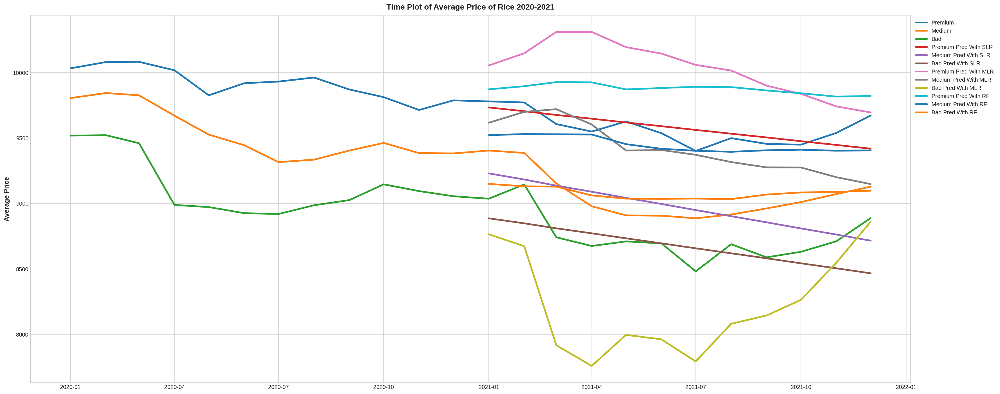

In [174]:
plt.figure(figsize=(28,12))
plt.plot(df['Average Price of Premium Quality Rice'],label='Premium') 
plt.plot(df['Average Price of Medium Quality Rice'],label='Medium') 
plt.plot(df['Average Price of Bad Quality Rice'],label='Bad')
plt.plot(AvgPricePremium_pred,label='Premium Pred With SLR')
plt.plot(AvgPriceMedium_pred,label='Medium Pred With SLR')
plt.plot(AvgPriceBad_pred,label='Bad Pred With SLR')
plt.plot(AvgPricePremium_pred_v2,label='Premium Pred With MLR')
plt.plot(AvgPriceMedium_pred_v2,label='Medium Pred With MLR')
plt.plot(AvgPriceBad_pred_v2,label='Bad Pred With MLR')
plt.plot(AvgPricePremium_pred_with_randomforest,label='Premium Pred With RF')
plt.plot(AvgPriceMedium_pred_with_randomforest,label='Medium Pred With RF')
plt.plot(AvgPriceBad_pred_with_randomforest,label='Bad Pred With RF')
plt.title('Time Plot of Average Price of Rice 2020-2021' )
plt.ylabel("Average Price")
plt.legend(bbox_to_anchor = (1.0, 1), loc = 'upper left')
plt.show()

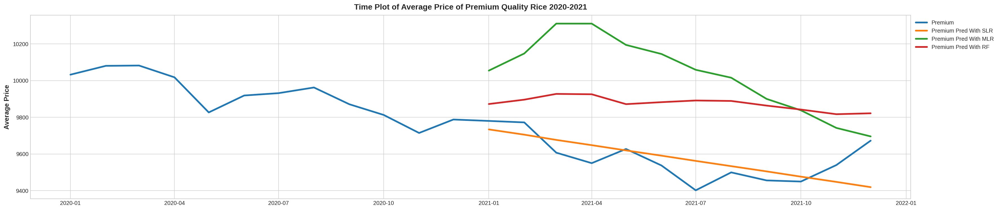

In [175]:
plt.figure(figsize=(28,6))
plt.plot(df['Average Price of Premium Quality Rice'],label='Premium') 
plt.plot(AvgPricePremium_pred,label='Premium Pred With SLR')
plt.plot(AvgPricePremium_pred_v2,label='Premium Pred With MLR')
plt.plot(AvgPricePremium_pred_with_randomforest,label='Premium Pred With RF')
plt.title('Time Plot of Average Price of Premium Quality Rice 2020-2021')
plt.ylabel("Average Price")
plt.legend(bbox_to_anchor = (1.0, 1), loc = 'upper left')
plt.show()

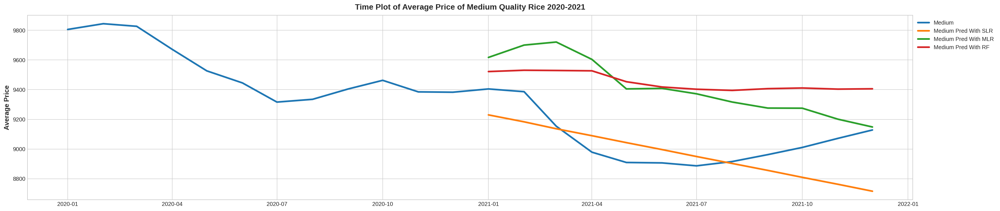

In [176]:
plt.figure(figsize=(28,6))
plt.plot(df['Average Price of Medium Quality Rice'],label='Medium') 
plt.plot(AvgPriceMedium_pred,label='Medium Pred With SLR')
plt.plot(AvgPriceMedium_pred_v2,label='Medium Pred With MLR')
plt.plot(AvgPriceMedium_pred_with_randomforest,label='Medium Pred With RF')
plt.title('Time Plot of Average Price of Medium Quality Rice 2020-2021')
plt.ylabel("Average Price")
plt.legend(bbox_to_anchor = (1.0, 1), loc = 'upper left')
plt.show()

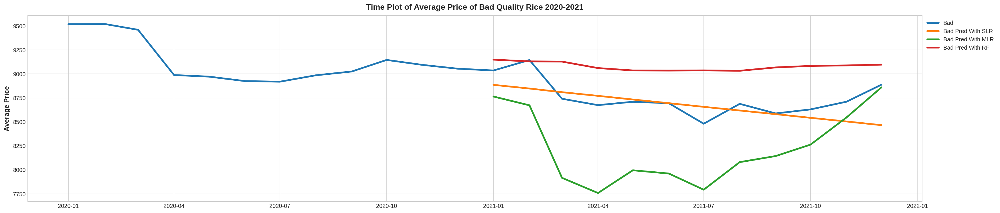

In [177]:
plt.figure(figsize=(28,6))
plt.plot(df['Average Price of Bad Quality Rice'],label='Bad')  
plt.plot(AvgPriceBad_pred,label='Bad Pred With SLR')
plt.plot(AvgPriceBad_pred_v2,label='Bad Pred With MLR')
plt.plot(AvgPriceBad_pred_with_randomforest,label='Bad Pred With RF')
plt.title('Time Plot of Average Price of Bad Quality Rice 2020-2021' )
plt.ylabel("Average Price")
plt.legend(bbox_to_anchor = (1.0, 1), loc = 'upper left')
plt.show()

Mean Absolute Error (MAE) 

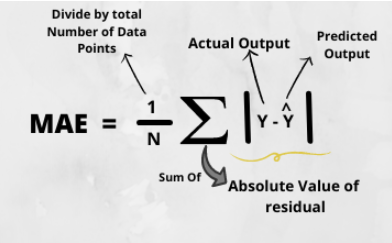

Mean Squared Error(MSE)

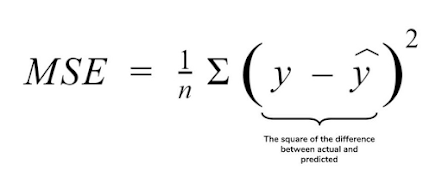

Mean Absolute Percentage Error (MAPE)

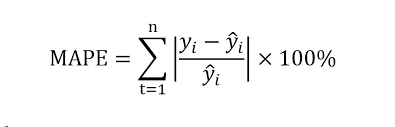

Root Mean Squared Error(RMSE) or root-mean-square deviation (RNSD)

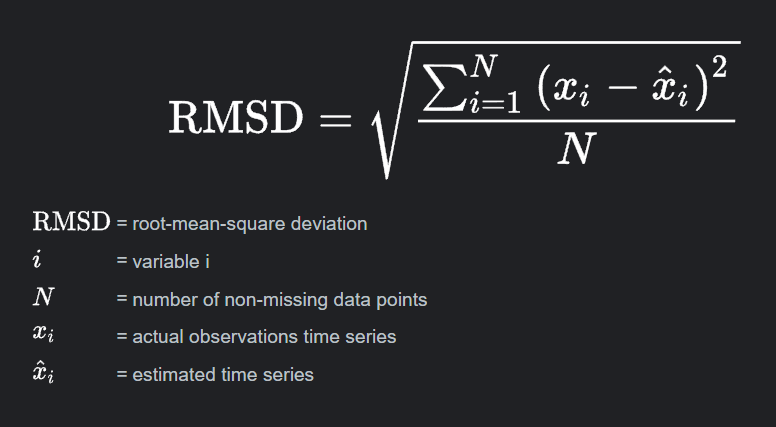


Root Mean Squared Log Error(RMSLE)

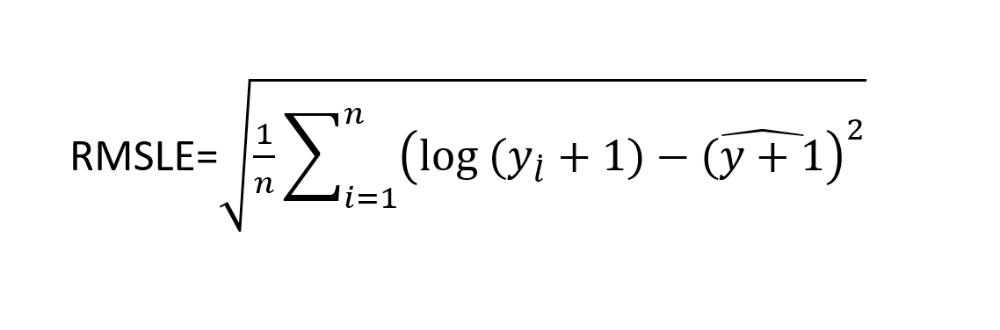

R Squared

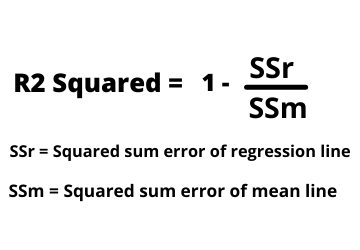

In [178]:
data_eval_train = pd.DataFrame(evaluation_train).T
data_eval_train

,MAE,MSE,MAPE,R squared,RMSE,RMSLE
Train SLR Premium,0.068596,0.007463,0.098361,0.738585,0.086391,-2.448874
Train MLR Premium,0.036517,0.002429,0.052338,0.914916,0.049286,-3.010109
Train RF Premium,0.029417,0.001283,0.042951,0.955047,0.035824,-3.329124
Train SLR Medium,0.091310,0.011264,0.155548,0.716035,0.106131,-2.243077
Train MLR Medium,0.017301,0.000733,0.030987,0.981509,0.027082,-3.608873
Train RF Medium,0.023160,0.000722,0.036464,0.981802,0.026867,-3.616844
Train SLR Bad,0.158468,0.028821,0.276622,0.357704,0.169768,-1.773324
Train MLR Bad,0.029257,0.001969,0.060494,0.956125,0.044370,-3.115181
Train RF Bad,0.037914,0.002382,0.061581,0.946912,0.048807,-3.019872


In [179]:
data_eval_test = pd.DataFrame(evaluation_test).T
data_eval_test

,MAE,MSE,MAPE,R squared,RMSE,RMSLE
Test SLR Premium,0.117276,0.022806,8.844011e+13,0.223439,0.151015,-1.890377
Test MLR Premium,0.676378,0.552790,3.624341e+14,-17.823307,0.743498,-0.296389
Test RF Premium,0.441961,0.226450,2.701393e+14,-6.710944,0.475867,-0.742616
Test SLR Medium,0.159665,0.039285,2.459262e+13,-0.218875,0.198204,-1.618460
Test MLR Medium,0.376817,0.175914,1.901775e+14,-4.458043,0.419421,-0.868879
Test RF Medium,0.408167,0.188547,2.022562e+14,-4.850007,0.434220,-0.834203
Test SLR Bad,0.128609,0.029997,6.349895e+13,-0.010397,0.173195,-1.753336
Test MLR Bad,0.499059,0.313048,2.481931e+14,-9.544632,0.559507,-0.580699
Test RF Bad,0.319527,0.122049,2.005597e+14,-3.111050,0.349354,-1.051668


<AxesSubplot: >

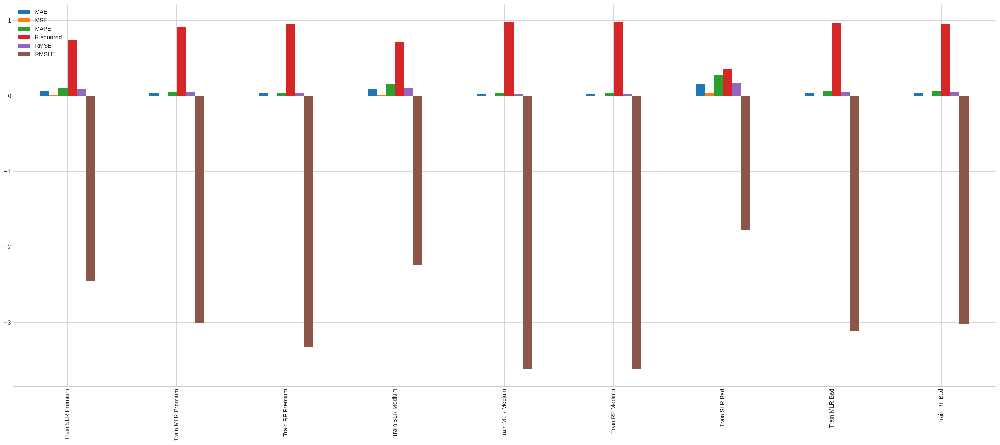

In [180]:
data_eval_train.plot(kind="bar", figsize = (30, 12))

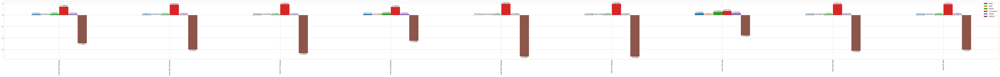

In [181]:
ax = data_eval_train.plot.bar(figsize=(100,6))

for container in ax.containers:
    ax.bar_label(container)

<AxesSubplot: >

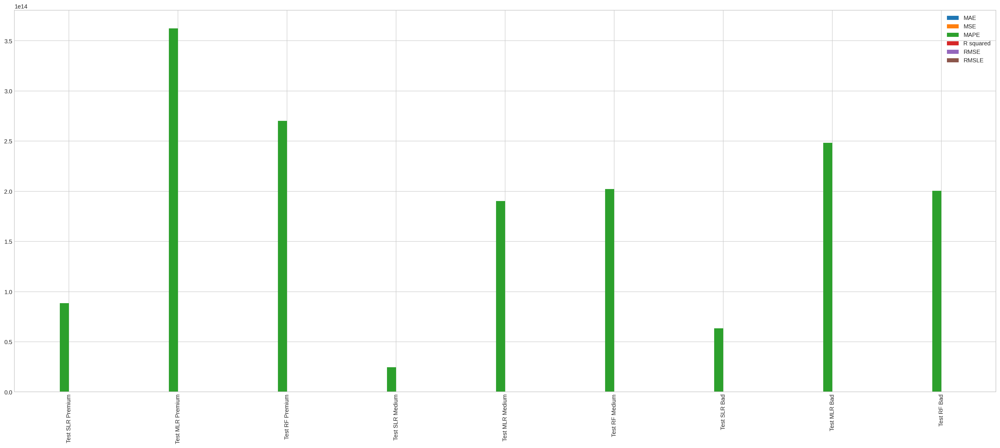

In [182]:
data_eval_test.plot(kind="bar", figsize = (30, 12))

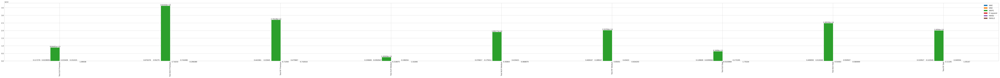

In [183]:
ax = data_eval_test.plot.bar(figsize=(100,6))

for container in ax.containers:
    ax.bar_label(container)

Training data only uses data in 2020.

The best model for predicting the Average Price of Premium Quality Rice, Average Price of Medium Quality Rice, and Average Price of Bad Quality Rice is Simple Linear Linear Regression but in this model we cannot do it with the shap and lime method. We will therefore choose the best method other than this method which can use shap and lime method.

Based on the results of the metric values for the evaluation of existing models.
*   To predict the Average Price of Premium Quality Rice we chose the Random Forest.
*   To predict the Average Price of Medium Quality Rice we chose the Multiple Linear Regression.
*   To predict the Average Price of Bad Quality Rice we chose the Random Forest.